In [1]:
import sys
sys.path.insert(0, '/home/zzhuang/PseCo')

In [ ]:
# this notebook only shows how to evaluate on the wild data. 
# Please check the path if you run on your own machine.

In [2]:
import os
from torchvision.utils import make_grid
from torchvision.transforms.functional import to_pil_image, to_tensor
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torch
from PIL import Image
import numpy as np
import tqdm
import albumentations as A
import torch.nn as nn
import torchvision
import torchvision.ops as vision_ops
from ops.foundation_models.segment_anything.utils.amg import batched_mask_to_box
from ops.ops import _nms, plot_results, convert_to_cuda
plt.rcParams["figure.dpi"] = 300
torch.cuda.set_device(1)
torch.autograd.set_grad_enabled(False)

INFO:albumentations.check_version:A new version of Albumentations is available: 1.4.10 (you have 1.4.7). Upgrade using: pip install --upgrade albumentations


In [3]:
def read_image(path):
    img = Image.open(path)
    transform = A.Compose([
        A.LongestMaxSize(1024),
        A.PadIfNeeded(1024, border_mode=0, position=A.PadIfNeeded.PositionType.TOP_LEFT, value=0),
    ])
    img = Image.fromarray(transform(image=np.array(img))['image'])
    return img

In [4]:
from ops.foundation_models.segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor, build_sam, build_sam_vit_b, build_sam_vit_h

# sam = build_sam_vit_b().cuda().eval()
sam = build_sam_vit_h().cuda().eval()

In [5]:
# project_root = './PseCo'

In [6]:
from ops.dump_clip_features import dump_clip_image_features, dump_clip_text_features

In [7]:
import json
# You have to download the data from google drive and check the path
all_data = json.load(open('/home/zzhuang/PseCo/annotation_FSC147_384_with_gt.json'))

In [8]:
# fname = list((all_data.keys()))[0]
fname = '215.jpg'

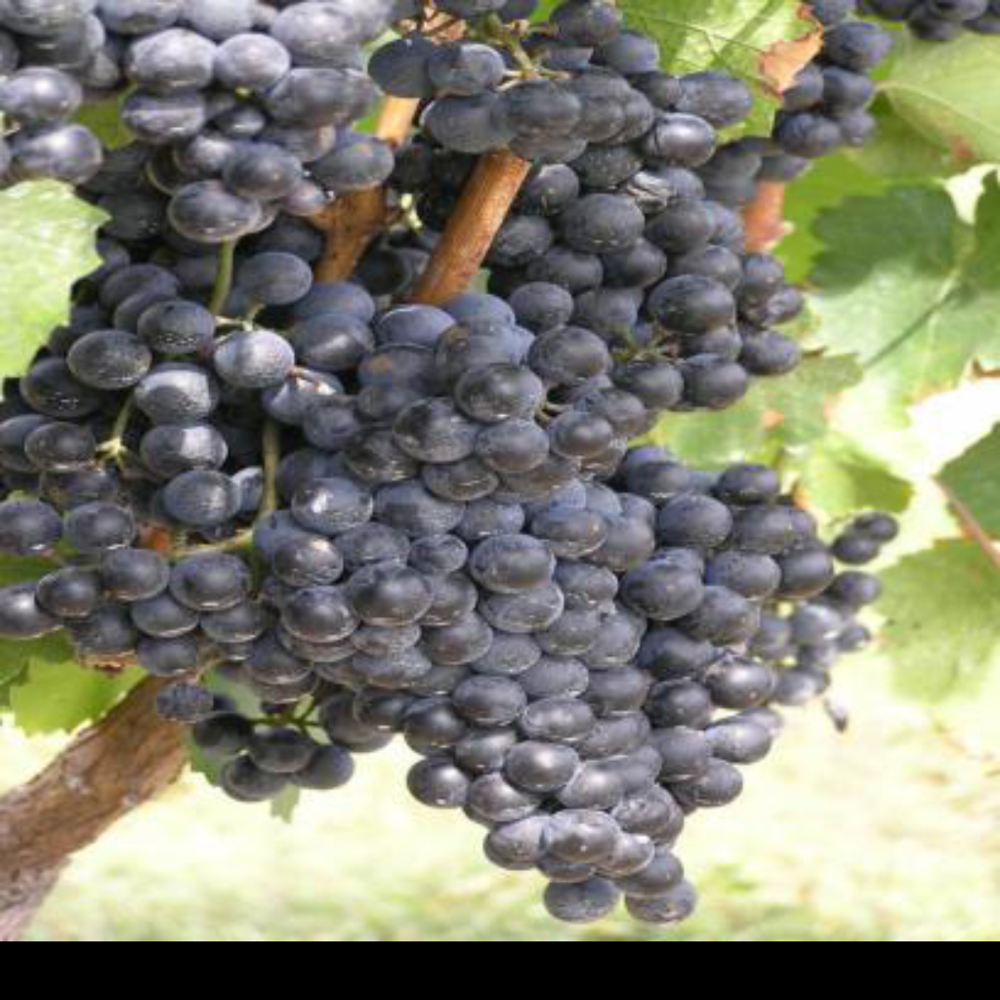

In [9]:
image = read_image(f'/home/zzhuang/DATASET2/FSC147_384_V2/images_384_VarV2/{fname}')
image

In [10]:
# resize example boxes
example_boxes = torch.Tensor(all_data[fname]['box_examples_coordinates']) * 1024 / max(all_data[fname]['height'], all_data[fname]['width']) 
example_boxes

tensor([[466.8235, 371.4510, 557.1765, 434.1961],
        [318.7451, 138.0392, 401.5686, 198.2745],
        [800.6274, 117.9608, 863.3726, 160.6275]])

In [11]:
# few-shot
example_features = dump_clip_image_features(image, example_boxes).cuda()

from models import ROIHeadMLP as ROIHead
cls_head = ROIHead().cuda().eval()
cls_head.load_state_dict(torch.load('/home/zzhuang/PseCo/MLP_small_box_w1_fewshot.tar', map_location='cpu')['cls_head'])

<All keys matched successfully>

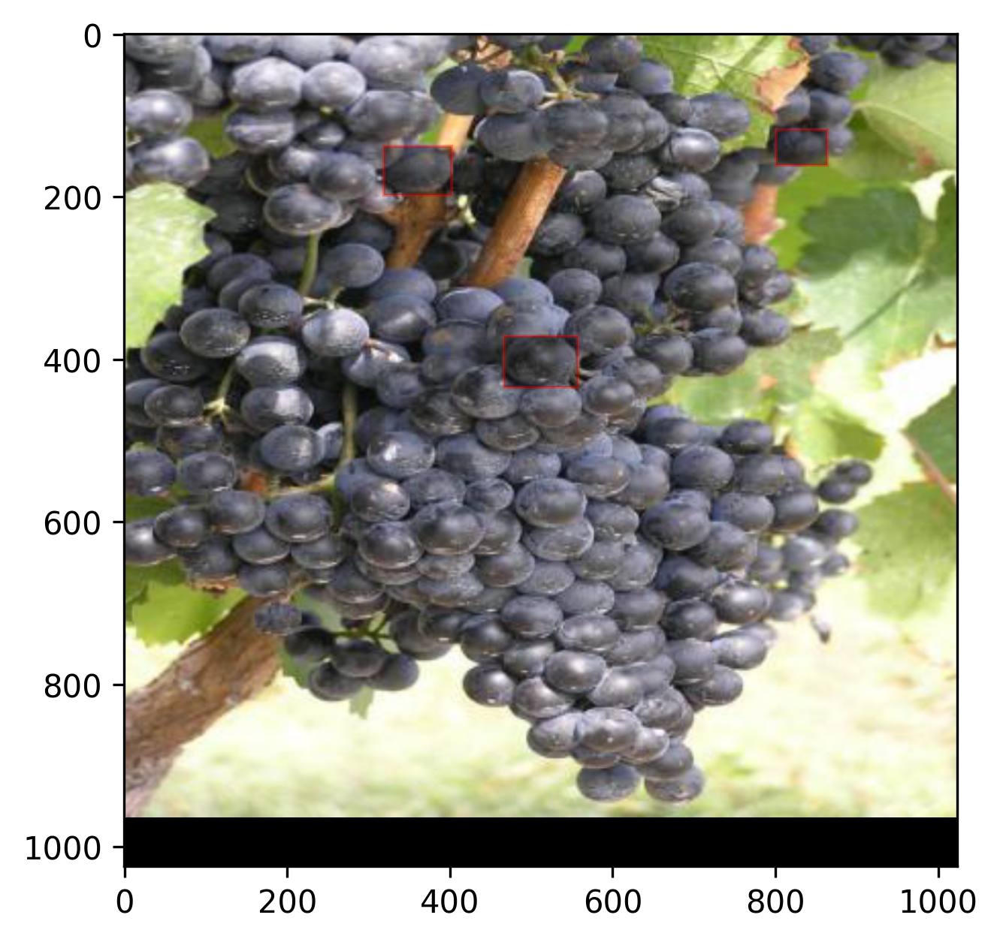

In [12]:
plot_results(image,
    bboxes=example_boxes,
             )

In [29]:
# zeroshot
# class_name = 'bread rolls'
# example_features = dump_clip_text_features([class_name, ])[class_name].unsqueeze(0).cuda()
# from models import ROIHeadMLP as ROIHead
# cls_head = ROIHead().cuda().eval()
# cls_head.load_state_dict(torch.load(f'{project_root}/data/fsc147/checkpoints/MLP_small_box_w1_zeroshot.tar', map_location='cpu')['cls_head'])

# Extract image features

In [13]:
import torchvision.transforms as transforms
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
with torch.no_grad():
    new_image = transform(image).unsqueeze(0).cuda()
    features = sam.image_encoder(new_image)

# Load point decoder and extract heatmaps

In [14]:
from models import PointDecoder
point_decoder = PointDecoder(sam).cuda().eval()
state_dict = torch.load('/home/zzhuang/PseCo/point_decoder_vith.pth',
                        map_location='cpu')
point_decoder.load_state_dict(state_dict)
with torch.no_grad():
    point_decoder.max_points = 1000
    point_decoder.point_threshold = 0.05
    point_decoder.nms_kernel_size = 3
    outputs_heatmaps = point_decoder(features)
    pred_heatmaps = outputs_heatmaps['pred_heatmaps'].cpu().squeeze().clamp(0, 1)

# Show points

torch.Size([554, 2])


(-0.5, 1023.5, 1023.5, -0.5)

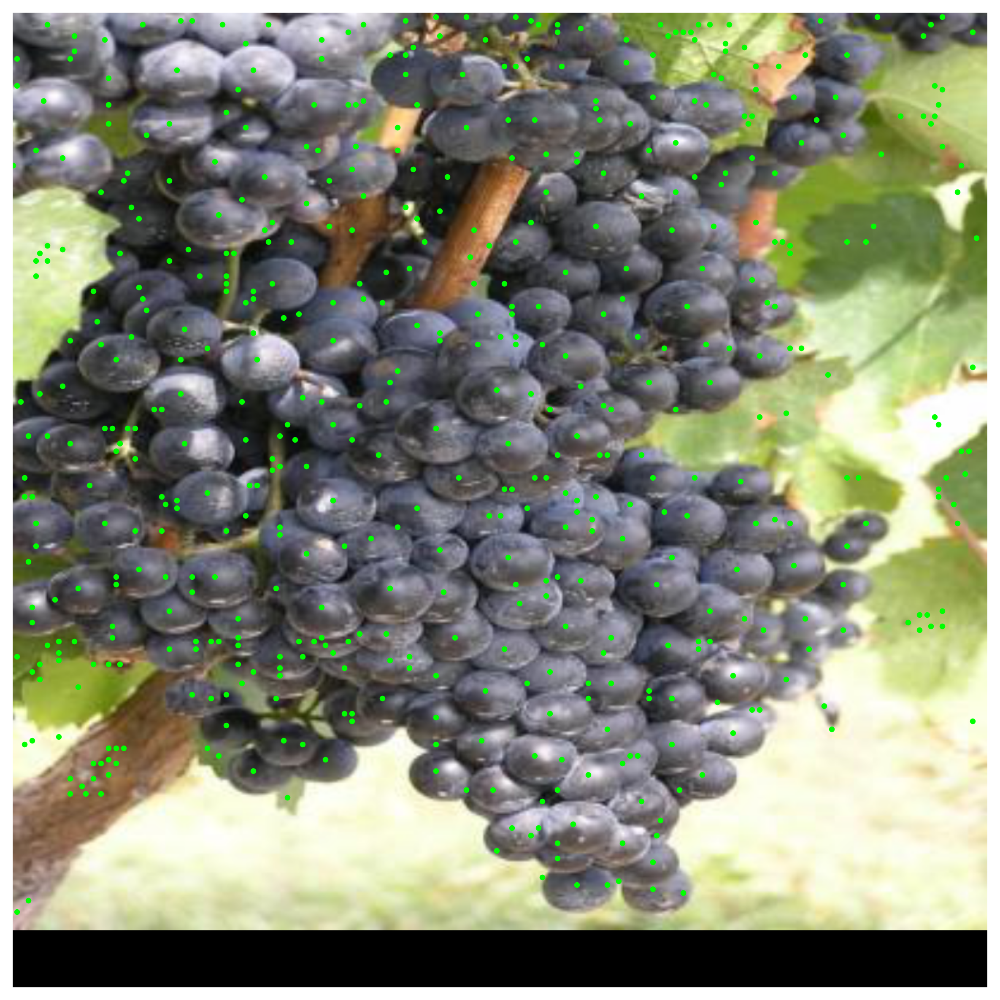

In [15]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
pred_points = outputs_heatmaps['pred_points'].squeeze().reshape(-1, 2)
pred_points_score = outputs_heatmaps['pred_points_score'].squeeze()
print(pred_points.size())
plt.scatter(pred_points[:, 0].cpu(), pred_points[:, 1].cpu(), s=20, marker='.', c='lime')
plt.axis('off')
# # plt.show()
# plt.savefig('/home/zzhuang/tmp.jpg', bbox_inches='tight', pad_inches = 0,dpi=400)

In [16]:
pred_points.size()

torch.Size([554, 2])

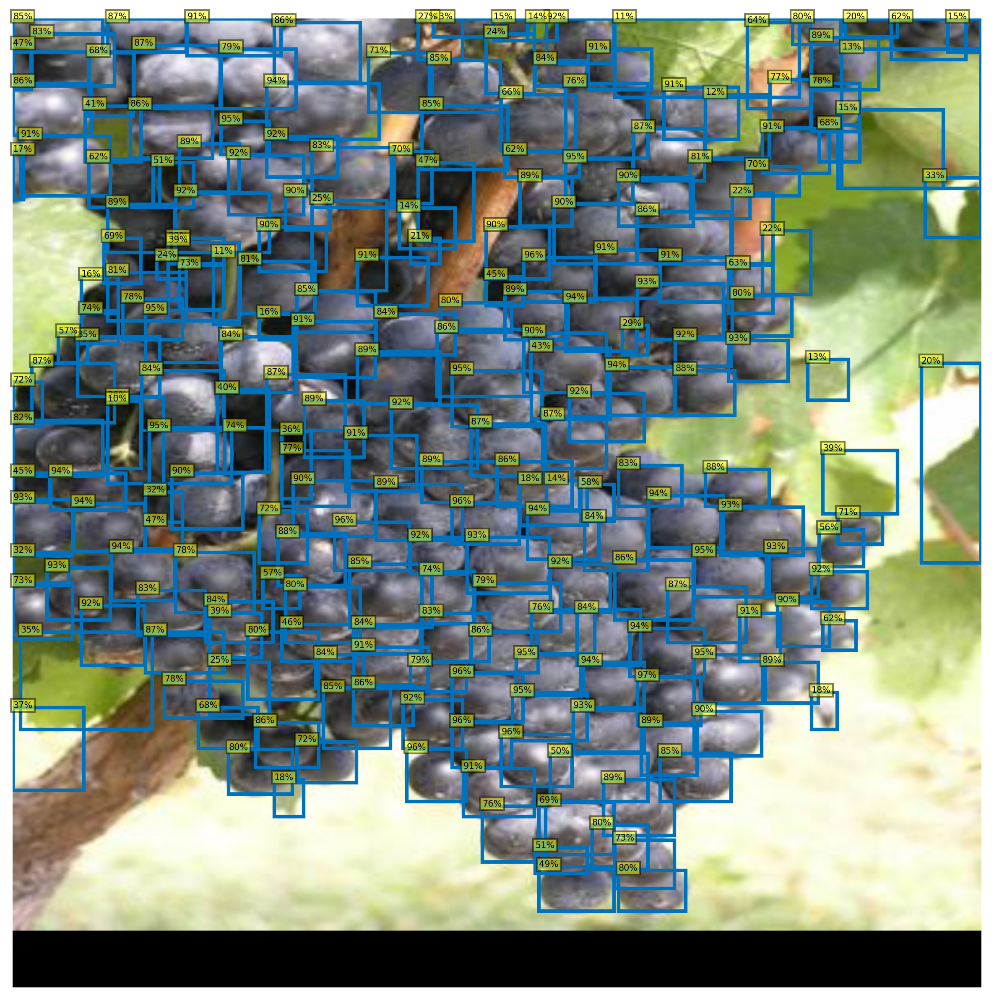

In [17]:
_ = cls_head.eval()
with torch.no_grad():
    all_pred_boxes = []
    all_pred_ious = []
    cls_outs = []
    for indices in torch.arange(len(pred_points)).split(128):
        with torch.no_grad():
            outputs_points = sam.forward_sam_with_embeddings(features, points=pred_points[indices])
            pred_boxes = outputs_points['pred_boxes']
            pred_logits = outputs_points['pred_ious']

            for anchor_size in [8, ]:
                anchor = torch.Tensor([[-anchor_size, -anchor_size, anchor_size, anchor_size]]).cuda()
                anchor_boxes = pred_points[indices].repeat(1, 2) + anchor
                anchor_boxes = anchor_boxes.clamp(0., 1024.)
                outputs_boxes = sam.forward_sam_with_embeddings(features, points=pred_points[indices], boxes=anchor_boxes)
                pred_logits = torch.cat([pred_logits, outputs_boxes['pred_ious'][:, 1].unsqueeze(1)], dim=1)
                pred_boxes = torch.cat([pred_boxes, outputs_boxes['pred_boxes'][:, 1].unsqueeze(1)], dim=1)

            all_pred_boxes.append(pred_boxes)
            all_pred_ious.append(pred_logits)
            cls_outs_ = cls_head(features, [pred_boxes, ], [example_features, ] * len(indices))
            cls_outs_ = cls_outs_.sigmoid().view(-1, len(example_features), 5).mean(1)
            pred_logits = cls_outs_ * pred_logits
        cls_outs.append(pred_logits)
    pred_boxes = torch.cat(all_pred_boxes)
    pred_ious = torch.cat(all_pred_ious)
    cls_outs = torch.cat(cls_outs)
    pred_boxes = pred_boxes[torch.arange(len(pred_boxes)), torch.argmax(cls_outs, dim=1)]
    scores = cls_outs.max(1).values
    indices = vision_ops.nms(pred_boxes, scores, 0.5)
    pred_boxes = pred_boxes[indices]
    scores = scores[indices]

plt.figure(figsize=(10,10))
COLORS = [[0.000, 0.447, 0.741], ]
plt.imshow(image)
for p, (xmin, ymin, xmax, ymax), c in zip(scores, pred_boxes.tolist(), COLORS * len(pred_boxes)):
    if p < 0.1:
        continue
    plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                               fill=False, color=c,
                               linewidth=2.0,
                               ))
    text = f'{int(p*100)}%'
    plt.gca().text(xmin, ymin, text,
            fontsize=5,
            bbox=dict(facecolor='yellow',
                      boxstyle='square,pad=.25',
                      alpha=0.5)
            )
plt.axis('off')
plt.show()

In [18]:
len(all_data[fname]['annotations']), (scores > 0.34).sum()

(258, tensor(200, device='cuda:1'))

In [22]:
## Combines all

In [19]:
# avoid extract features
all_data_with_features = torch.load('/mnt/pami202/zzhuang/FSC/sam/all_data_vith.pth', map_location='cpu')

In [21]:
all_data_with_features[fname]

{'class_name': 'grapes',
 'split': 'val',
 'box_examples_coordinates': tensor([[466.8235, 371.4510, 557.1765, 434.1961],
         [318.7451, 138.0392, 401.5686, 198.2745],
         [800.6275, 117.9608, 863.3726, 160.6275]]),
 'annotations': {'points': tensor([[ 568.4912,  483.7135],
          [ 539.6548,  454.2946],
          [ 454.6183,  446.1870],
          [ 389.7536,  465.4502],
          [ 346.5161,  520.2161],
          [ 376.7738,  559.7667],
          [ 398.4011,  611.4846],
          [ 392.6304,  654.0710],
          [ 412.8193,  671.3103],
          [ 334.9747,  666.2385],
          [ 329.2211,  634.8078],
          [ 320.5737,  575.9819],
          [ 285.9666,  543.5392],
          [ 288.8605,  604.3768],
          [ 248.4998,  637.8436],
          [ 281.6514,  670.2983],
          [ 176.4260,  668.2625],
          [ 174.9876,  628.7239],
          [ 212.4543,  594.2453],
          [ 130.2946,  588.1615],
          [  82.7419,  603.3649],
          [  23.6308,  629.7359],
  

In [29]:
torch.autograd.set_grad_enabled(False)
# gater all predictions
all_predictions = {}

split = 'val'
# split = 'test'
filenames = [fname for fname in all_data if all_data[fname]['split'] == split]
for fname in tqdm.tqdm(filenames):
    # if fname != '215.jpg':
    #     continue
    # # resize example boxes
    # example_boxes = torch.Tensor(all_data[fname]['box_examples_coordinates']) * 1024 / max(all_data[fname]['height'], all_data[fname]['width']) 
    # # few-shot
    # example_features = dump_clip_image_features(image, example_boxes).cuda()
    # new_image = transform(image).unsqueeze(0).cuda()
    # features = sam.image_encoder(new_image)
    features = all_data_with_features[fname]['features'].cuda()
    example_features = all_data_with_features[fname]['example_clip_features'].cuda()
    point_decoder.max_points = 1000
    point_decoder.point_threshold = 0.05
    point_decoder.nms_kernel_size = 3
    outputs_heatmaps = point_decoder(features)
    pred_heatmaps = outputs_heatmaps['pred_heatmaps'].cpu().squeeze().clamp(0, 1)
    pred_points = outputs_heatmaps['pred_points'].squeeze().reshape(-1, 2)
    pred_points_score = outputs_heatmaps['pred_points_score'].squeeze()
    
    _ = cls_head.eval()
    all_pred_boxes = []
    all_pred_ious = []
    cls_outs = []
    for indices in torch.arange(len(pred_points)).split(128):
        outputs_points = sam.forward_sam_with_embeddings(features, points=pred_points[indices])
        pred_boxes = outputs_points['pred_boxes']
        pred_logits = outputs_points['pred_ious']

        for anchor_size in [8, ]:
            anchor = torch.Tensor([[-anchor_size, -anchor_size, anchor_size, anchor_size]]).cuda()
            anchor_boxes = pred_points[indices].repeat(1, 2) + anchor
            anchor_boxes = anchor_boxes.clamp(0., 1024.)
            outputs_boxes = sam.forward_sam_with_embeddings(features, points=pred_points[indices], boxes=anchor_boxes)
            pred_logits = torch.cat([pred_logits, outputs_boxes['pred_ious'][:, 1].unsqueeze(1)], dim=1)
            pred_boxes = torch.cat([pred_boxes, outputs_boxes['pred_boxes'][:, 1].unsqueeze(1)], dim=1)

        all_pred_boxes.append(pred_boxes)
        all_pred_ious.append(pred_logits)
        cls_outs_ = cls_head(features, [pred_boxes, ], [example_features, ] * len(indices))
        cls_outs_ = cls_outs_.sigmoid().view(-1, len(example_features), 5).mean(1)
        pred_logits = cls_outs_ * pred_logits
        cls_outs.append(pred_logits)
    pred_boxes = torch.cat(all_pred_boxes)
    pred_ious = torch.cat(all_pred_ious)
    cls_outs = torch.cat(cls_outs)
    pred_boxes = pred_boxes[torch.arange(len(pred_boxes)), torch.argmax(cls_outs, dim=1)]
    scores = cls_outs.max(1).values
    indices = vision_ops.nms(pred_boxes, scores, 0.5)
    pred_boxes = pred_boxes[indices]
    scores = scores[indices]

    all_predictions[fname] = {
        'pred_boxes': pred_boxes.cpu(),
        'scores': scores.cpu(),
    }

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1286/1286 [15:06<00:00,  1.42it/s]


In [80]:
# all_predictions[fname]

In [30]:
(all_predictions['215.jpg']['scores'] > 0.3).sum()

tensor(203)

In [36]:
#https://github.com/Hzzone/PseCo/blob/bcb280ead7a977f1bbe85397fde912c777932a1d/fsc147/4_1_train_roi_head.py#L166

In [37]:
# threshold = None # for val set
# threshold = # set on val and used for test

In [33]:
threshold = None # for val set
# threshold = 0.34 # set on val and used for test

def eval_counting(thresh):
    total_mae = 0.
    total_mse = 0.
    total_nae = 0.
    total_sre = 0.
    for i, fname in enumerate(all_predictions):
        num_points = len(all_data[fname]['annotations'])
        err = abs(num_points - (all_predictions[fname]['scores'] > thresh).sum())
        # print(fname, (all_predictions[fname]['scores'] > thresh).sum(), num_points, err)
        total_mae += err
        total_mse += err ** 2
        total_nae += err / num_points
        total_sre += err ** 2 / num_points
    cnt = len(all_predictions)
    mae = float(total_mae / cnt)
    # print(thresh, mae)
    mse = float((total_mse / cnt) ** 0.5)
    nae = float(total_nae / cnt)
    sre = float((total_sre / cnt) ** 0.5)
    return mae, mse, nae, sre

if threshold is None:
    mae, mse, nae, sre = [], [], [], []
    thresholds = np.arange(0, 1., 0.01)
    for thresh in thresholds:
        mae_, mse_, nae_, sre_ = eval_counting(thresh)
        mae.append(mae_)
        mse.append(mse_)
        nae.append(nae_)
        sre.append(sre_)
    mae, mse, nae, sre, thresh = mae[np.argmin(mae)], mse[np.argmin(mae)], nae[np.argmin(mae)], sre[np.argmin(mae)], \
        thresholds[np.argmin(mae)]
    # results['THRESH'] = thresh
else:
    mae, mse, nae, sre = eval_counting(threshold)

In [34]:
# all_predictions[fname]['scores'] > thresh

In [35]:
mae, mse, nae, sre, thresh

(15.040435791015625,
 67.33644104003906,
 0.21511855721473694,
 3.074174165725708,
 0.36)

In [45]:
all_data[fname]

{'class_name': 'birds',
 'split': 'val',
 'box_examples_coordinates': [[143, 186, 162, 206],
  [219, 29, 243, 53],
  [407, 179, 432, 201],
  [343, 234, 370, 262]],
 'annotations': {'69': {'points': [9.214799880981445, 47.172340393066406]},
  '70': {'points': [194.4263916015625, 193.6973419189453]},
  '71': {'points': [284.2223815917969, 190.327880859375]},
  '72': {'points': [110.7959976196289, 350.3306884765625]},
  '73': {'points': [204.52320861816406, 244.78529357910156]},
  '74': {'points': [421.72198486328125, 244.78529357910156]},
  '75': {'points': [423.4020080566406, 100.5038070678711]},
  '76': {'points': [473.3567810058594, 188.08436584472656]},
  '77': {'points': [358.3019714355469, 245.9112548828125]},
  '78': {'points': [216.87120056152344, 112.29268646240234]},
  '79': {'points': [226.41358947753906, 243.65933227539062]},
  '80': {'points': [65.89800262451172, 47.172340393066406]},
  '81': {'points': [495.2388000488281, 27.518598556518555]},
  '82': {'points': [369.524383